In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import numpy as np
import random
import time
import fiftyone as fo
import fiftyone.zoo as foz
import fiftyone.brain as fob
from tqdm.notebook import tqdm, tnrange
from PIL import Image
import matplotlib.pyplot as plt
import torchsummary
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import os

In [2]:
# Set random seed for reproducibility
# random.seed(0)
# np.random.seed(0)
# torch.manual_seed(0)

### Încăracarea setului de date
Folosim LFWfunneled ca set de date, având o aliniere mai bună a fețelor.

In [3]:
# lfw_dataset = foz.load_zoo_dataset(
#     "lfw",
#     split="train",
#     shuffle=True,
#     seed=0
# )
# load data from local
lfw_dataset = fo.Dataset.from_dir(
    dataset_dir='/home/ichitu/fiftyone/lfw/lfw_funneled',
    dataset_type=fo.types.dataset_types.ImageClassificationDirectoryTree,
    name='lfw_funneled',
    overwrite=True,
    
)




   0% ||------------|     1/13233 [9.4ms elapsed, 2.1m remaining, 106.6 samples/s] 

   4% |/------------|   585/13233 [143.3ms elapsed, 3.1s remaining, 4.1K samples/s] 

  11% |█------------|  1465/13233 [472.3ms elapsed, 3.8s remaining, 3.1K samples/s] 

  15% |█\-----------|  1999/13233 [589.9ms elapsed, 3.3s remaining, 3.4K samples/s] 

  22% |██|----------|  2908/13233 [785.6ms elapsed, 2.8s remaining, 3.7K samples/s] 

  29% |███/---------|  3837/13233 [989.4ms elapsed, 2.4s remaining, 3.9K samples/s] 

  36% |████---------|  4749/13233 [1.3s elapsed, 2.4s remaining, 3.6K samples/s]    

  40% |█████\-------|  5290/13233 [1.4s elapsed, 2.2s remaining, 3.7K samples/s]    

  47% |██████|------|  6178/13233 [1.7s elapsed, 1.9s remaining, 3.7K samples/s]    

  53% |██████/------|  7051/13233 [1.8s elapsed, 1.6s remaining, 3.8K samples/s]    

  60% |███████------|  7961/13233 [2.2s elapsed, 1.5s remaining, 3.6K samples/s]    

  64% |████████\----|  8487/13233 [2.3s elapsed, 1.3s remaining, 3.8K samples/s]    

  71% |█████████|---|  9403/13233 [2.5s elapsed, 999.2ms remaining, 3.9K samples/s] 

  78% |██████████/--| 10322/13233 [2.7s elapsed, 755.2ms remaining, 3.9K samples/s] 

  85% |███████████--| 11246/13233 [3.0s elapsed, 550.4ms remaining, 3.6K samples/s] 

  89% |███████████\-| 11781/13233 [3.2s elapsed, 381.5ms remaining, 3.8K samples/s] 

  96% |████████████|| 12679/13233 [3.4s elapsed, 143.9ms remaining, 3.9K samples/s] 

 100% |█████████████| 13233/13233 [3.5s elapsed, 0s remaining, 3.8K samples/s]      

 100% |█████████████| 13233/13233 [3.5s elapsed, 0s remaining, 3.8K samples/s]      


In [4]:
DIM = 224

Crearea unui set de date custom pentru a avea acces prin index la imagini, dar și la etichete pentru o identificare facilă a persoanelor

In [5]:
class LFWDataset:
    def __init__(self, dataset, dim=DIM):
        self.dataset = dataset
        self.filepaths = list(dataset.values("filepath"))
        self.dim = dim
    
    def __len__(self):
        return len(self.filepaths)
    
    def preprocess(self, image, dim):
        image = image.resize((dim, dim))
        return image
    
    def image_path(self, idx):
        return self.filepaths[idx]
    
    def __getitem__(self, idx):
        impath = self.filepaths[idx]
        sample = self.dataset[impath]
        image = Image.open(impath).convert("RGB")
        image = self.preprocess(image, self.dim)
        image = np.array(image)
        label = sample["ground_truth"]["label"]
        return image, label
    
full_dataset = LFWDataset(lfw_dataset, dim=DIM)
print(full_dataset.image_path(7))

/home/ichitu/fiftyone/lfw/lfw_funneled/Aaron_Peirsol/Aaron_Peirsol_0003.jpg


### Alegerea perechilor
Conform articolului http://www.whdeng.cn/FGLFW/FGLFW.html alegerea aleatorie a imaginilor duce la o acuratețe mare falsă, imaginile negative fiind cu mult diferite de ancore. Din această cauză folosim un fișier text pentru selectarea perechilor, care la fiecare 600 de linii are 300 de perechi matched, apoi 300 mismatched, alternând între ele de 10 ori. Astfel rezultă 10 seturi cu câte 1200 imagini fiecare

In [6]:
def parse_fglfw_pairs(file_path, dataset_path):
    with open(file_path, "r", encoding="utf-8") as f:
        lines = [line.strip() for line in f.readlines()]

    sets = []
    idx = 0
    # Each set has 600 lines for matched (300 pairs) and 600 lines for mismatched (300 pairs)
    for _ in range(10):
        matched = []
        mismatched = []
        # Read 300 matched pairs (2 lines each)
        for i in range(300):
            # add dataset path to image paths
            matched.append((os.path.join(dataset_path, lines[idx + 2*i]), os.path.join(dataset_path, lines[idx + 2*i + 1])))
        idx += 600
        # Read 300 mismatched pairs (2 lines each)
        for i in range(300):
            # add dataset path to image paths
            mismatched.append((os.path.join(dataset_path, lines[idx + 2*i]), os.path.join(dataset_path, lines[idx + 2*i + 1])))
        idx += 600
        sets.append({"matched": matched, "mismatched": mismatched})

    return sets

In [7]:
file_path = "/home/ichitu/fiftyone/lfw/lfw_funneled/pair_FGLFW.txt"
pairs = parse_fglfw_pairs(file_path, "/home/ichitu/fiftyone/lfw/lfw_funneled")
print("Parsed", len(pairs), "sets.")
print("Each set has:", len(pairs[0]["matched"]), "matched pairs and", len(pairs[0]["mismatched"]), "mismatched pairs.")

Parsed 10 sets.
Each set has: 300 matched pairs and 300 mismatched pairs.


Generarea de batch-uri pe baza perechilor formate mai sus

In [8]:
def batch_generator(dataset, pairs, batch_size, dim=DIM, dataset_path="/home/ichitu/fiftyone/lfw/lfw_funneled"):
    dataset_size = len(dataset)
    if dataset_size < batch_size:
        raise ValueError("Dataset size is smaller than the batch size. \
                         Cannot generate batches.")
    
    anchors_positives = [np.zeros((batch_size, dim, dim, 3), dtype=np.float32), 
               [""] * batch_size]
    positives = [np.zeros((batch_size, dim, dim, 3), dtype=np.float32), 
                 [""] * batch_size]
    anchors_negatives = [np.zeros((batch_size, dim, dim, 3), dtype=np.float32), 
                 [""] * batch_size]
    negatives = [np.zeros((batch_size, dim, dim, 3), dtype=np.float32), 
                 [""] * batch_size]
    while True:
        for i in range(batch_size):
            # Select a random set
            set_ = random.choice(pairs)
            # Select a random matched pair
            matched_pair = random.choice(set_["matched"])
            # Select a random mismatched pair
            mismatched_pair = random.choice(set_["mismatched"])
            # Load the images
            anchor_positive = Image.open(matched_pair[0]).convert("RGB")
            positive = Image.open(matched_pair[1]).convert("RGB")
            anchors_negative = Image.open(mismatched_pair[0]).convert("RGB")
            negative = Image.open(mismatched_pair[1]).convert("RGB")
            # Preprocess the images
            anchor_positive = anchor_positive.resize((dim, dim))
            positive = positive.resize((dim, dim))
            anchors_negative = anchors_negative.resize((dim, dim))
            negative = negative.resize((dim, dim))
            # Convert to numpy arrays
            anchor_positive = np.array(anchor_positive)
            positive = np.array(positive)
            anchors_negative = np.array(anchors_negative)
            negative = np.array(negative)
            # Add to the batch
            anchors_positives[0][i] = anchor_positive
            anchors_positives[1][i] = matched_pair[0]
            positives[0][i] = positive
            positives[1][i] = matched_pair[1]
            anchors_positives[0][i] = anchor_positive / 255.
            anchors_positives[1][i] = matched_pair[0].replace(dataset_path + "/","").split("/")[0]
            positives[0][i] = positive / 255.
            positives[1][i] = matched_pair[1].replace(dataset_path + "/","").split("/")[0]
            anchors_negatives[0][i] = anchors_negative / 255.
            anchors_negatives[1][i] = mismatched_pair[0].replace(dataset_path + "/","").split("/")[0]
            negatives[0][i] = negative / 255.
            negatives[1][i] = mismatched_pair[1].replace(dataset_path + "/","").split("/")[0]
        yield [anchors_positives, positives, anchors_negatives, negatives]
        


Generarea în mod aleator a batch-urilor

In [9]:
def batch_generator3(dataset, batch_size, dim=DIM):
    dataset_size = len(dataset)
    if dataset_size < batch_size:
        raise ValueError("Dataset size is smaller than the batch size. \
                         Cannot generate batches.")
    
    anchors = [np.zeros((batch_size, DIM, DIM, 3), dtype=np.float32), 
               [""] * batch_size]
    positives = [np.zeros((batch_size, DIM, DIM, 3), dtype=np.float32), 
                 [""] * batch_size]
    negatives = [np.zeros((batch_size, DIM, DIM, 3), dtype=np.float32), 
                 [""] * batch_size]

    while True:
        for i in range(batch_size):
            if len(dataset) <= 0:  # Check if the dataset is exhausted
                return  # Stop the generator if the dataset is empty
            anchor_idx = np.random.randint(len(dataset))
            anchor, label = dataset[anchor_idx]
            positive_indices = np.where(np.array(dataset.dataset.values(
                "ground_truth.label")) == label)[0]
            negative_indices = np.where(np.array(dataset.dataset.values(
                "ground_truth.label")) != label)[0]
            if len(positive_indices) == 0 or len(negative_indices) == 0:  
                # Check if no valid pairs are available
                continue
            positive_idx = np.random.choice(positive_indices)
            negative_idx = np.random.choice(negative_indices)
            positive, positive_label = dataset[positive_idx]
            negative, negative_label = dataset[negative_idx]

            anchors[0][i] = anchor
            anchors[1][i] = label
            positives[0][i] = positive
            positives[1][i] = positive_label
            negatives[0][i] = negative
            negatives[1][i] = negative_label

        yield anchors, positives, negatives


Testez generatorul

In [10]:
BS = 1
generator = batch_generator(full_dataset, pairs, BS)

['Hashim_Thaci']
['Hashim_Thaci']
['Dick_Cheney']
['John_Marburger']


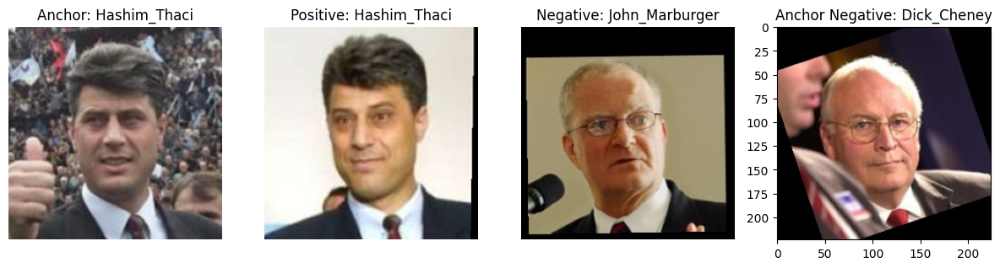

In [11]:
# Get a batch of data
batch = next(generator)
anchor = batch[0]
positive = batch[1]
anchor_negative = batch[2]
negative = batch[3]
print(anchor[1])
print(positive[1])
print(anchor_negative[1])
print(negative[1])
for i in range(BS):
    fig, ax = plt.subplots(1, 4, figsize=(15, 15))
    ax[0].imshow(anchor[0][i])
    ax[0].set_title("Anchor:" + " " + anchor[1][i])
    ax[0].axis("off")
    ax[1].imshow(positive[0][i])
    ax[1].set_title("Positive:" + " " + positive[1][i])
    ax[1].axis("off")
    ax[2].imshow(negative[0][i])
    ax[2].set_title("Negative:" + " " + negative[1][i])
    ax[2].axis("off")
    ax[3].imshow(anchor_negative[0][i])
    ax[3].set_title("Anchor Negative:" + " " + anchor_negative[1][i])
    plt.show()

### Modelele


##### Model după Zeiler-Fergus
Am încercat implementarea lui, dar nu am reușit, neclarități în cum ar trebui implementat conform https://arxiv.org/pdf/1503.03832

In [12]:
class FaceRecZF(nn.Module):
    def __init__(self, input_shape = (3, 220, 220)):
        super(FaceRecZF, self).__init__()
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=7, stride=2, padding=3)
        self.pool1 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.rnorm1 = nn.LocalResponseNorm(size=1)
        self.conv2a = nn.Conv2d(in_channels=64, out_channels=64, kernel_size=1, stride=1, padding=0)
        self.conv2 = nn.Conv2d(in_channels=64, out_channels=192, kernel_size=3, stride=1, padding=1)
        self.rnorm2 = nn.LocalResponseNorm(size=1)
        self.pool2 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.conv3a = nn.Conv2d(in_channels=192, out_channels=192, kernel_size=1, stride=1, padding=0)
        self.conv3 = nn.Conv2d(in_channels=192, out_channels=384, kernel_size=3, stride=1, padding=1)
        self.pool3 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.conv4a = nn.Conv2d(in_channels=384, out_channels=384, kernel_size=1, stride=1, padding=0)
        self.conv4 = nn.Conv2d(in_channels=384, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.conv5a = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=1, stride=1, padding=0)
        self.conv5 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.conv6a = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=1, stride=1, padding=0)
        self.conv6 = nn.Conv2d(in_channels=256, out_channels=256, kernel_size=3, stride=1, padding=1)
        self.pool4 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.concat = nn.Flatten()
        self.fc1 = nn.Linear(256, 128)
        self.fc2 = nn.Linear(128, 128)
        self.fc7132 = nn.Linear(128, 128)

    def L2Norm(self, x):
        return F.normalize(x, p=2, dim=1)
    
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.pool1(x)
        x = self.rnorm1(x)
        x = F.relu(self.conv2a(x))
        x = F.relu(self.conv2(x))
        x = self.rnorm2(x)
        x = self.pool2(x)
        x = F.relu(self.conv3a(x))
        x = F.relu(self.conv3(x))
        x = self.pool3(x)
        x = F.relu(self.conv4a(x))
        x = F.relu(self.conv4(x))
        x = F.relu(self.conv5a(x))
        x = F.relu(self.conv5(x))
        x = F.relu(self.conv6a(x))
        x = F.relu(self.conv6(x))
        x = self.pool4(x)
        # x = self.concat(x)
        # x = F.relu(self.fc1(x))
        # x = F.relu(self.fc2(x))
        # x = self.fc7132(x)
        return x
    

In [13]:
# device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# model = FaceRecZF().to(device)
# torchsummary.summary(model, (3, 220, 220))

### Model după GoogleLeNet
Tot conform articolului de mai sus, dar pentru blocurile de inception am folosit publicația https://arxiv.org/pdf/1409.4842

<img src="/home/ichitu/py-files/Resources/Captură de ecran 2025-01-20 112241.png">

In [14]:
class FaceRecInception(nn.Module):
    def __init__(self, input_shape=(3, 220, 220)):
        super(FaceRecInception, self).__init__()

        self.conv1 = nn.Conv2d(in_channels=3, out_channels=64, kernel_size=7, stride=2, padding=3)
        self.max_pool1 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)
        self.rnorm1 = nn.LocalResponseNorm(size=1)
        
        # Inception Module 1
        def inception_block1(in_channels, out_channels):
            conv3x3_reduce = nn.Conv2d(in_channels, out_channels[0], kernel_size=1)
            conv3x3 = nn.Conv2d(out_channels[0], out_channels[1], kernel_size=3, padding=1)
            return nn.Sequential(
                conv3x3_reduce,
                nn.ReLU(),
                conv3x3,
                nn.ReLU()
            )    
        self.inception1 = inception_block1(64, [64, 192])

        self.rnorm2 = nn.LocalResponseNorm(size=1)
        self.max_pool2 = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Inception Modules 1x1, 3x3, 5x5, and Pooling
        def inception_block1x1(in_channels, out_channels):
            conv1x1 = nn.Conv2d(in_channels, out_channels[0], kernel_size=1)
            return nn.Sequential(
                conv1x1,
                nn.ReLU()
            )
        def inception_block3x3(in_channels, out_channels, stride=1):
            conv3x3_reduce = nn.Conv2d(in_channels, out_channels[0], kernel_size=1)
            conv3x3 = nn.Conv2d(out_channels[0], out_channels[1], kernel_size=3, padding=1, stride=stride)
            return nn.Sequential(
                conv3x3_reduce,
                nn.ReLU(),
                conv3x3,
                nn.ReLU()
            )
        def inception_block5x5(in_channels, out_channels, stride=1):
            conv5x5_reduce = nn.Conv2d(in_channels, out_channels[0], kernel_size=1)
            conv5x5 = nn.Conv2d(out_channels[0], out_channels[1], kernel_size=5, padding=2, stride=stride)
            return nn.Sequential(
                conv5x5_reduce,
                nn.ReLU(),
                conv5x5,
                nn.ReLU()
            )
        
        class L2Pooling(nn.Module):
            def __init__(self):
                super(L2Pooling, self).__init__()
            def forward(self, x):
                return torch.sqrt(F.avg_pool2d(x**2, kernel_size=3, stride=1, padding=1))

        def pool_proj(in_channels, out_channels, max_pool=True):
            if max_pool:
                return nn.Sequential(
                    nn.MaxPool2d(kernel_size=3, stride=1, padding=1),
                    nn.Conv2d(in_channels, out_channels, kernel_size=1),
                    nn.ReLU()
                   )
            else:
                return nn.Sequential(
                    L2Pooling(),
                    nn.Conv2d(in_channels, out_channels, kernel_size=1),
                    nn.ReLU()
                )
        
        # Inception Module 3a
        self.inception3a1x1 = inception_block1x1(192, [64])
        self.inception3a3x3 = inception_block3x3(192, [96, 128])
        self.inception3a5x5 = inception_block5x5(192, [16, 32])
        self.inception3apool = pool_proj(192, 32, max_pool=True)

        # Inception Module 3b
        self.inception3b1x1 = inception_block1x1(256, [64])
        self.inception3b3x3 = inception_block3x3(256, [96, 128])
        self.inception3b5x5 = inception_block5x5(256, [32, 64])
        self.inception3bpool = pool_proj(256, 64, max_pool=False)

        # Inception Module 3c
        self.inception3c3x3 = inception_block3x3(320, [128, 256], stride=2)
        self.inception3c5x5 = inception_block5x5(320, [32, 64], stride=2)
        self.inception3cpool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Inception Module 4a
        self.inception4a1x1 = inception_block1x1(640, [256])
        self.inception4a3x3 = inception_block3x3(640, [96, 192])
        self.inception4a5x5 = inception_block5x5(640, [32, 64])
        self.inception4apool = pool_proj(640, 128, max_pool=False)

        # Inception Module 4b
        self.inception4b1x1 = inception_block1x1(640, [DIM])
        self.inception4b3x3 = inception_block3x3(640, [112, DIM])
        self.inception4b5x5 = inception_block5x5(640, [32, 64])
        self.inception4bpool = pool_proj(640, 128, max_pool=False)

        # Inception Module 4c
        self.inception4c1x1 = inception_block1x1(640, [192])
        self.inception4c3x3 = inception_block3x3(640, [128, 256])
        self.inception4c5x5 = inception_block5x5(640, [32, 64])
        self.inception4cpool = pool_proj(640, 128, max_pool=False)

        # Inception Module 4d
        self.inception4d1x1 = inception_block1x1(640, [160])
        self.inception4d3x3 = inception_block3x3(640, [144, 288])
        self.inception4d5x5 = inception_block5x5(640, [32, 64])
        self.inception4dpool = pool_proj(640, 128, max_pool=False)

        # Inception Module 4e
        self.inception4e3x3 = inception_block3x3(640, [160, 256], stride=2)
        self.inception4e5x5 = inception_block5x5(640, [64, 128], stride=2)
        self.inception4epool = nn.MaxPool2d(kernel_size=3, stride=2, padding=1)

        # Inception Module 5a
        self.inception5a1x1 = inception_block1x1(1024, [384])
        self.inception5a3x3 = inception_block3x3(1024, [192, 384])
        self.inception5a5x5 = inception_block5x5(1024, [48, 128])
        self.inception5apool = pool_proj(1024, 128, max_pool=False)

        # Inception Module 5b
        self.inception5b1x1 = inception_block1x1(1024, [384])
        self.inception5b3x3 = inception_block3x3(1024, [192, 384])
        self.inception5b5x5 = inception_block5x5(1024, [48, 128])
        self.inception5bpool = pool_proj(1024, 128, max_pool=True)

        # Final Pooling and Fully Connected Layer
        self.avg_pool = nn.AvgPool2d(kernel_size=7, stride=1)
        self.fc1 = nn.Linear(1024, 128)

        # L2 Normalization
        def L2Norm(x):
            return F.normalize(x, p=2, dim=1)
        self.L2Norm = L2Norm

        
    def forward(self, x):
        x = F.relu(self.conv1(x))
        x = self.max_pool1(x)
        x = self.rnorm1(x)
        x = self.inception1(x)
        x = self.rnorm2(x)
        x = self.max_pool2(x)

        # Inception Module 3a
        inception3a1x1 = self.inception3a1x1(x)
        inception3a3x3 = self.inception3a3x3(x)
        inception3a5x5 = self.inception3a5x5(x)
        inception3apool = self.inception3apool(x)
        x = torch.cat([inception3a1x1, inception3a3x3, inception3a5x5, inception3apool], 1)

        # Inception Module 3b
        inception3b1x1 = self.inception3b1x1(x)
        inception3b3x3 = self.inception3b3x3(x)
        inception3b5x5 = self.inception3b5x5(x)
        inception3bpool = self.inception3bpool(x)
        x = torch.cat([inception3b1x1, inception3b3x3, inception3b5x5, inception3bpool], 1)

        # Inception Module 3c
        inception3c3x3 = self.inception3c3x3(x)
        inception3c5x5 = self.inception3c5x5(x)
        inception3cpool = self.inception3cpool(x)
        x = torch.cat([inception3c3x3, inception3c5x5, inception3cpool], 1)

        # Inception Module 4a
        inception4a1x1 = self.inception4a1x1(x)
        inception4a3x3 = self.inception4a3x3(x)
        inception4a5x5 = self.inception4a5x5(x)
        inception4apool = self.inception4apool(x)
        x = torch.cat([inception4a1x1, inception4a3x3, inception4a5x5, inception4apool], 1)

        # Inception Module 4b
        inception4b1x1 = self.inception4b1x1(x)
        inception4b3x3 = self.inception4b3x3(x)
        inception4b5x5 = self.inception4b5x5(x)
        inception4bpool = self.inception4bpool(x)
        x = torch.cat([inception4b1x1, inception4b3x3, inception4b5x5, inception4bpool], 1)

        # Inception Module 4c
        inception4c1x1 = self.inception4c1x1(x)
        inception4c3x3 = self.inception4c3x3(x)
        inception4c5x5 = self.inception4c5x5(x)
        inception4cpool = self.inception4cpool(x)
        x = torch.cat([inception4c1x1, inception4c3x3, inception4c5x5, inception4cpool], 1)

        # Inception Module 4d
        inception4d1x1 = self.inception4d1x1(x)
        inception4d3x3 = self.inception4d3x3(x)
        inception4d5x5 = self.inception4d5x5(x)
        inception4dpool = self.inception4dpool(x)
        x = torch.cat([inception4d1x1, inception4d3x3, inception4d5x5, inception4dpool], 1)

        # Inception Module 4e
        inception4e3x3 = self.inception4e3x3(x)
        inception4e5x5 = self.inception4e5x5(x)
        inception4epool = self.inception4epool(x)
        x = torch.cat([inception4e3x3, inception4e5x5, inception4epool], 1)

        # Inception Module 5a
        inception5a1x1 = self.inception5a1x1(x)
        inception5a3x3 = self.inception5a3x3(x)
        inception5a5x5 = self.inception5a5x5(x)
        inception5apool = self.inception5apool(x)
        x = torch.cat([inception5a1x1, inception5a3x3, inception5a5x5, inception5apool], 1)

        # Inception Module 5b
        inception5b1x1 = self.inception5b1x1(x)
        inception5b3x3 = self.inception5b3x3(x)
        inception5b5x5 = self.inception5b5x5(x)
        inception5bpool = self.inception5bpool(x)
        x = torch.cat([inception5b1x1, inception5b3x3, inception5b5x5, inception5bpool], 1)

        # Final Pooling and Fully Connected Layer
        x = self.avg_pool(x)
        x = x.view(x.size(0), -1)
        x = self.fc1(x)

        # L2 Normalization
        x = self.L2Norm(x)
        return x

**Sumarizarea modelului**

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model_inception = FaceRecInception().to(device)
# print(model)
torchsummary.summary(model_inception, (3, DIM, DIM))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,472
         MaxPool2d-2           [-1, 64, 56, 56]               0
 LocalResponseNorm-3           [-1, 64, 56, 56]               0
            Conv2d-4           [-1, 64, 56, 56]           4,160
              ReLU-5           [-1, 64, 56, 56]               0
            Conv2d-6          [-1, 192, 56, 56]         110,784
              ReLU-7          [-1, 192, 56, 56]               0
 LocalResponseNorm-8          [-1, 192, 56, 56]               0
         MaxPool2d-9          [-1, 192, 28, 28]               0
           Conv2d-10           [-1, 64, 28, 28]          12,352
             ReLU-11           [-1, 64, 28, 28]               0
           Conv2d-12           [-1, 96, 28, 28]          18,528
             ReLU-13           [-1, 96, 28, 28]               0
           Conv2d-14          [-1, 128,

**Asigurarea că ponderile nu sunt inițializate cu 0**

In [16]:
# ...existing code...
for name, param in model_inception.named_parameters():
    print(name, param.mean().item(), param.std().item())
# ...existing code...

conv1.weight -0.00033527662162669003 0.04751335456967354
conv1.bias 0.014523603022098541 0.044965676963329315
inception1.0.weight -0.0017126334132626653 0.07211168855428696
inception1.0.bias 0.018596963956952095 0.07010549306869507
inception1.2.weight 2.9726223147008568e-05 0.024070899933576584
inception1.2.bias -0.002125044586136937 0.02625325135886669
inception3a1x1.0.weight 0.0009355969959869981 0.0419510118663311
inception3a1x1.0.bias -0.0009567071683704853 0.03942127153277397
inception3a3x3.0.weight 0.0007218114333227277 0.04165249317884445
inception3a3x3.0.bias 0.0016747061163187027 0.04186965525150299
inception3a3x3.2.weight 7.007521344348788e-05 0.019648348912596703
inception3a3x3.2.bias 0.002766918856650591 0.018143797293305397
inception3a5x5.0.weight 0.0010429170215502381 0.041897304356098175
inception3a5x5.0.bias -0.026693329215049744 0.03800075501203537
inception3a5x5.2.weight -9.440518624614924e-06 0.028875313699245453
inception3a5x5.2.bias 0.005575780291110277 0.030361814

### Calcularea puterii de calucul necesare
**Încercarea cu profiler de la torch**

In [17]:
# get the number of FLOPs and number of parameters
import torch.profiler

model = FaceRecInception().to(device)
model.eval()
inputs = torch.randn(100, 3, DIM, DIM).to(device)
# Use the profiler to estimate FLOPS
with torch.profiler.profile(
    activities=[torch.profiler.ProfilerActivity.CPU, torch.profiler.ProfilerActivity.CUDA],
    with_flops=True
    ) as prof:
    model(inputs)

# Print the profiling results
print(prof.key_averages().table(sort_by="self_cuda_time_total", row_limit=-1))


-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                                   Name    Self CPU %      Self CPU   CPU total %     CPU total  CPU time avg     Self CUDA   Self CUDA %    CUDA total  CUDA time avg    # of Calls  Total MFLOPs  
-------------------------------------------------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  ------------  
                                aten::cudnn_convolution        43.16%      30.474ms        83.50%      58.961ms     999.337us      20.098ms        32.68%      20.098ms     340.637us            59            --  
                                             aten::add_         0.61%     427.400us         1.03%     729.636us      12.367us       6.657ms        10.8

**Încercarea cu o librăria https://github.com/facebookresearch/fvcore**

In [18]:
from fvcore.nn import FlopCountAnalysis

flops = FlopCountAnalysis(model, inputs)
print(f"FLOPs: {flops.total()/1e9:.2f} G")

Unsupported operator aten::max_pool2d encountered 6 time(s)


Unsupported operator aten::mul encountered 4 time(s)


Unsupported operator aten::pad encountered 2 time(s)


Unsupported operator aten::avg_pool3d encountered 2 time(s)


Unsupported operator aten::add encountered 2 time(s)


Unsupported operator aten::pow encountered 8 time(s)


Unsupported operator aten::div encountered 3 time(s)


Unsupported operator aten::avg_pool2d encountered 7 time(s)


Unsupported operator aten::sqrt encountered 6 time(s)


Unsupported operator aten::linalg_vector_norm encountered 1 time(s)


Unsupported operator aten::clamp_min encountered 1 time(s)


Unsupported operator aten::expand_as encountered 1 time(s)


FLOPs: 159.65 G


##### Funcțiile de cost 
Funcțiile de cost încearcă să minimizeze distanța euclidiană între imagini asemănătoare și să o maximiseze între imaginiile diferite.
* Triplet loss clasic (disponibil și în torch):

$
\sum_{i}^{N}[ \|f(x_{i}^{a}) - f(x_{i}^{p})\|_2^2 -  \|f(x_{i}^{a}) - f(x_{i}^{n})\|_2^2 + \alpha]_+
$
* Încercare de a găsi o funcție pentru 4 elemente, Quartet loss
* Triplet loss pentru perechiile matched - mismatched: 

$
\sum_{i}^{N}[ \|f(x_{i}^{a_p}) - f(x_{i}^{p})\|_2^2 -  \|f(x_{i}^{a_n}) - f(x_{i}^{n})\|_2^2 + \alpha]_+
$

In [19]:
def triplet_loss(anchor, positive, negative, margin=0.2):
    distance_positive = F.pairwise_distance(anchor, positive)
    distance_negative = F.pairwise_distance(anchor, negative)
    loss = torch.mean(F.relu(distance_positive - distance_negative + margin))
    return loss

In [20]:
def quartet_loss_1(anchor, positive, negative, anchor_negative, margin=0.2):
    distance_positive = F.pairwise_distance(anchor, positive)
    distance_negative = F.pairwise_distance(anchor_negative, negative)
    distance_anchor_negative = F.pairwise_distance(anchor, anchor_negative)
    loss = torch.mean(F.relu(distance_positive - distance_negative + margin)+ F.relu(distance_positive - distance_anchor_negative + margin))
    return loss

In [21]:
def quartet_loss_2(anchor, positive, negative, anchor_negative, margin=0.2):
    distance_positive = F.pairwise_distance(anchor, positive)
    distance_negative = F.pairwise_distance(anchor, negative)
    distance_anchor_negative = F.pairwise_distance(anchor, anchor_negative)
    distance_anchor_negative_negative = F.pairwise_distance(anchor_negative, negative)
    loss = torch.mean(F.relu(distance_positive - distance_negative + margin) + F.relu(distance_positive - distance_anchor_negative + margin) +\
                        F.relu(distance_positive - distance_anchor_negative_negative + margin))
    return loss

In [22]:
def equal_distances(a , b):
    distance_a_b = F.pairwise_distance(a, b)
    # print("Distance between a and b:", distance_a_b)
    return distance_a_b

def pair_triplet_loss(anchor_positive, positive, anchor_negative, negative, margin=0.2):
    distance_positive = F.pairwise_distance(anchor_positive, positive)
    distance_negative = F.pairwise_distance(anchor_negative, negative)

    # assert equal_distances(distance_positive, distance_negative) != 0, "Distance between anchor-positive and anchor-negative is equal to 0."
    loss = torch.mean(F.relu(distance_positive - distance_negative + margin))
    return loss

##### Antrenarea
Modelul calculează embeddinguri pentru fiecare imagine, apoi aceste embeddinguri se pun în funcția de loss

In [23]:
def train_triplet_loss(model, generator, optimizer, scheduler, device, epochs=25, bathes_per_epoch=100):
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model, device_ids=[0,1]).to(device)
    model.train()
    train_losses = []
    for epoch in tnrange(epochs, desc="Epochs"):
        running_loss = 0.0
        for i, data in zip(tnrange(bathes_per_epoch, desc="Batches"), generator):
            anchors, positives, negatives,_ = data
            anchors = torch.tensor(anchors[0], device=device, dtype=torch.float32).transpose(1, 3)
            positives = torch.tensor(positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            negatives = torch.tensor(negatives[0], device=device, dtype=torch.float32).transpose(1, 3)

            optimizer.zero_grad()
            anchor_embeddings = model(anchors)
            positive_embeddings = model(positives)
            negative_embeddings = model(negatives)
            # loss = triplet_loss(anchor_embeddings, positive_embeddings, negative_embeddings)
            loss = F.triplet_margin_loss(anchor_embeddings, positive_embeddings, negative_embeddings, margin=0.2)
            loss.backward()
            optimizer.step()
            scheduler.step(loss)
            running_loss += loss.item()
            
        print(f"Epoch {epoch+1}, Loss: {running_loss/(i+1)}")
        train_losses.append(running_loss/(i+1))
    print("Finished Training")
    return model, train_losses

In [24]:
def train_quartet_loss1(model, generator, optimizer,scheduler, device, epochs=25, bathes_per_epoch=100, loss_fn=quartet_loss_2):
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model, device_ids=[0,1]).to(device)
    model.train()
    train_losses = []
    for epoch in tnrange(epochs, desc="Epochs"):
        running_loss = 0.0
        for i, data in zip(tnrange(bathes_per_epoch, desc="Batches", leave=False), generator):
            anchors_positives, positives, anchors_negatives, negatives = data
            anchors_positives = torch.tensor(anchors_positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            positives = torch.tensor(positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            anchors_negatives = torch.tensor(anchors_negatives[0], device=device, dtype=torch.float32).transpose(1, 3)
            negatives = torch.tensor(negatives[0], device=device, dtype=torch.float32).transpose(1, 3)

            optimizer.zero_grad()
            anchor_positive_embeddings = model(anchors_positives)
            positive_embeddings = model(positives)
            anchor_negative_embeddings = model(anchors_negatives)
            negative_embeddings = model(negatives)
            loss = quartet_loss_1(anchor_positive_embeddings, positive_embeddings, negative_embeddings, anchor_negative_embeddings)
            loss.backward()
            optimizer.step()
            scheduler.step(loss)
            running_loss += loss.item()
            
        print(f"Epoch {epoch+1}, Loss: {running_loss/(i+1)}")
        train_losses.append(running_loss/(i+1))
    print("Finished Training")
    return model, train_losses

In [25]:
def train_quartet_loss2(model, generator, optimizer,scheduler, device, epochs=25, bathes_per_epoch=100, loss_fn=quartet_loss_2):
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model, device_ids=[0,1]).to(device)
    model.train()
    train_losses = []
    for epoch in tnrange(epochs, desc="Epochs"):
        running_loss = 0.0
        for i, data in zip(tnrange(bathes_per_epoch, desc="Batches", leave=False), generator):
            anchors_positives, positives, anchors_negatives, negatives = data
            anchors_positives = torch.tensor(anchors_positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            positives = torch.tensor(positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            anchors_negatives = torch.tensor(anchors_negatives[0], device=device, dtype=torch.float32).transpose(1, 3)
            negatives = torch.tensor(negatives[0], device=device, dtype=torch.float32).transpose(1, 3)

            optimizer.zero_grad()
            anchor_positive_embeddings = model(anchors_positives)
            positive_embeddings = model(positives)
            anchor_negative_embeddings = model(anchors_negatives)
            negative_embeddings = model(negatives)
            loss = quartet_loss_2(anchor_positive_embeddings, positive_embeddings, negative_embeddings, anchor_negative_embeddings)
            loss.backward()
            optimizer.step()
            scheduler.step(loss)
            running_loss += loss.item()
            
        print(f"Epoch {epoch+1}, Loss: {running_loss/(i+1)}")
        train_losses.append(running_loss/(i+1))
    print("Finished Training")
    return model, train_losses

In [26]:
def train_pair_triplet_loss(model, generator, optimizer, scheduler, device, epochs=25, bathes_per_epoch=100):
    if torch.cuda.device_count() > 1:
        model = nn.DataParallel(model, device_ids=[0,1]).to(device)
    model.train()
    train_losses = []
    for epoch in tnrange(epochs, desc="Epochs"):
        running_loss = 0.0
        for i, data in zip(tnrange(bathes_per_epoch, desc="Batches", leave=False), generator):
            anchors_positives, positives, anchors_negatives, negatives = data
            anchors_positives = torch.tensor(anchors_positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            positives = torch.tensor(positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            anchors_negatives = torch.tensor(anchors_negatives[0], device=device, dtype=torch.float32).transpose(1, 3)
            negatives = torch.tensor(negatives[0], device=device, dtype=torch.float32).transpose(1, 3)

            optimizer.zero_grad()
            anchor_positive_embeddings = model(anchors_positives)
            positive_embeddings = model(positives)
            anchor_negative_embeddings = model(anchors_negatives)
            negative_embeddings = model(negatives)
            # print(anchor_positive_embeddings, positive_embeddings, anchor_negative_embeddings, negative_embeddings)
            loss = pair_triplet_loss(anchor_positive_embeddings, positive_embeddings, anchor_negative_embeddings, negative_embeddings)
            loss.backward()
            optimizer.step()
            scheduler.step(loss)
            running_loss += loss.item()
        
        print(f"Epoch {epoch+1}, Loss: {running_loss/(i+1)}")
        train_losses.append(running_loss/(i+1))
    print("Finished Training")
    return model, train_losses

**Optimizatori și learning rate**
* În publicația oficială se foloses ca optimizatori SGD și Adagrad cu $lr=0.05$. Fiindcă costul tinde să rămână în jurul valorii de 0.199 și fluctuează în testele mele (pe maxim 1h de antrenare, 10-25 epoci cu 100 batch-uri per epocă), am încercat să folosesc wheight decay, dar loss-ul ajungea să devină constant, sau Nan. Aceeași problemă a loss-ului constant am avut-o și cu Adagrad. Totodată embeddingurile deveneau toate constante

In [27]:
EPOCHS = 100
BATCHES_PER_EPOCH = 300

In [28]:
# reset the model
model_inception = FaceRecInception().to(device)
optimizer = optim.SGD(model_inception.parameters(), lr=0.5)
generator = batch_generator(full_dataset, pairs, 150)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.7, patience=5)
# model_inception, train_losses_sgd = train_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
# model_inception, train_losses_sgd = train_quartet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
model_inception, train_losses_sgd = train_quartet_loss1(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: 0.3999990406632423


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: 0.39999897132317225


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: 0.39999900877475736


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: 0.399998994966348


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: 0.39999897420406344


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: 0.3999989315867424


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: 0.39999900976816816


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: 0.39999898105859755


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: 0.39999895145495734


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: 0.3999989381432533


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: 0.39999895890553794


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: 0.39999896744887037


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: 0.3999990052978198


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: 0.39999902735153836


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: 0.39999898374080656


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: 0.3999989595015844


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3999989651640256


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: 0.39999901354312895


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: 0.39999895423650744


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3999989854296048


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: 0.3999989780783653


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: 0.3999989604949951


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: 0.3999989907940229


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: 0.3999989447991053


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: 0.39999894658724466


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: 0.3999989750981331


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: 0.3999990027149518


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: 0.39999895920356116


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: 0.39999893625577293


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: 0.3999989625811577


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: 0.3999989302953084


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: 0.3999989597002665


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: 0.3999989065527916


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: 0.39999897321065264


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: 0.39999901473522187


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: 0.39999893128871916


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: 0.3999988926450411


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: 0.399998980263869


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: 0.39999907414118446


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: 0.39999900152285894


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: 0.3999989640712738


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: 0.3999989378452301


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: 0.3999988843003909


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: 0.39999890913565955


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: 0.39999900927146276


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: 0.3999990059932073


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: 0.3999990197022756


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: 0.39999889612197875


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: 0.39999904443820317


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: 0.3999990276495616


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: 0.3999989701310794


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: 0.3999990058938662


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: 0.3999989903966586


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: 0.39999895840883254


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: 0.3999989821513494


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: 0.3999989193677902


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: 0.399998960395654


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: 0.399998925725619


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: 0.39999897410472235


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: 0.39999899715185167


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: 0.3999990156292915


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: 0.39999896834294


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: 0.39999899665514627


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: 0.3999989647666613


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: 0.3999990070859591


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: 0.39999901413917544


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: 0.39999895324309664


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: 0.3999989502628644


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: 0.39999902158975603


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: 0.39999899397293726


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: 0.39999896576007204


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: 0.3999989626804988


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: 0.39999899099270503


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: 0.39999896198511126


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: 0.3999989808599154


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: 0.3999989581108093


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: 0.39999895135561625


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: 0.3999989743034045


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: 0.3999990063905716


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: 0.3999989249308904


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: 0.3999989519516627


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: 0.3999989119172096


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: 0.3999989698330561


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: 0.39999899645646414


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: 0.3999989437063535


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: 0.3999989703297615


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: 0.39999896903832755


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: 0.3999990079800288


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: 0.39999897440274557


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: 0.39999896119038264


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: 0.3999988948305448


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: 0.39999898066123324


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: 0.39999897360801695


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: 0.39999900907278063


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: 0.39999897559483844


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: 0.39999899377425513


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: 0.3999990024169286


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: 0.39999899158875146


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: 0.39999896188577017


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: 0.3999989850322406
Finished Training


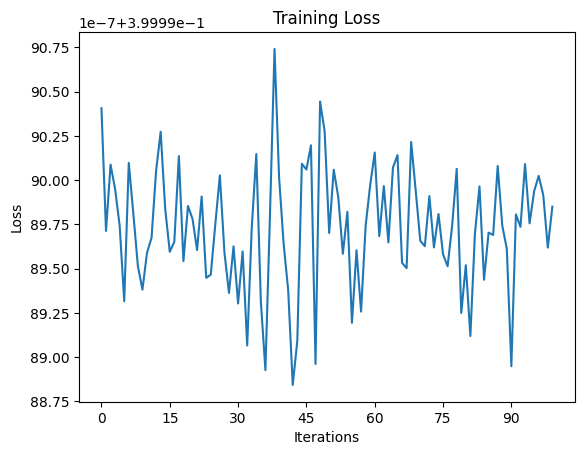

In [29]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_sgd)


In [30]:
# save the model
torch.save(model_inception.state_dict(), "quartet_loss1_SGD.pt")
torch.cuda.empty_cache()

In [31]:
# reset the model
model_inception = FaceRecInception().to(device)
optimizer = optim.SGD(model_inception.parameters(), lr=0.5)
generator = batch_generator(full_dataset, pairs, 150)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.7, patience=5)
# model_inception, train_losses_sgd = train_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
# model_inception, train_losses_sgd = train_quartet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
model_inception, train_losses_sgd = train_quartet_loss2(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: 0.5999971413612366


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: 0.5999971071879069


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: 0.599997126062711


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: 0.5999972256024678


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: 0.5999972228209177


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: 0.5999971695741018


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: 0.5999972508351008


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: 0.5999971759319306


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: 0.5999971767266591


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: 0.5999971399704616


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: 0.5999972412983576


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: 0.5999971993764242


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: 0.599997125864029


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: 0.5999972734848659


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: 0.5999971276521683


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: 0.59999731640021


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: 0.5999971451361974


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: 0.5999972168604533


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: 0.5999970976511637


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: 0.5999971989790599


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: 0.5999970597028732


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: 0.5999970841407776


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: 0.599997105995814


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: 0.59999720454216


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: 0.5999971997737884


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: 0.5999971036116282


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: 0.5999973239501317


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: 0.5999971787134807


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: 0.5999971443414688


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: 0.5999971159299214


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: 0.5999970978498459


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: 0.5999972220261892


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: 0.5999971387783686


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: 0.5999970622857411


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: 0.5999972687164943


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: 0.5999972852071126


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: 0.59999724706014


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: 0.5999972214301427


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: 0.5999972504377366


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: 0.5999971600373586


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: 0.5999971739451091


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: 0.5999973068634669


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: 0.5999971918265025


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: 0.5999973175923029


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: 0.599997236529986


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: 0.5999972240130107


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: 0.5999971610307694


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: 0.5999972583850225


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: 0.5999972985188167


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: 0.5999971334139506


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: 0.599997130036354


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: 0.5999972214301427


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: 0.5999972865978876


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: 0.5999970116217931


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: 0.5999972885847091


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: 0.5999971465269724


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: 0.599997255007426


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: 0.5999972448746363


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: 0.5999972027540207


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: 0.5999972246090571


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: 0.5999971514940262


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: 0.5999971832831701


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: 0.5999971739451091


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: 0.5999972639481227


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: 0.5999971131483713


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: 0.5999971375862757


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: 0.5999971141417821


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: 0.5999971453348796


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: 0.5999972786506017


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: 0.5999973183870315


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: 0.5999972007671992


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: 0.5999971924225489


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: 0.5999972101052602


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: 0.5999972627560297


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: 0.5999972641468048


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: 0.5999972999095917


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: 0.5999973209698996


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: 0.5999972254037857


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: 0.5999972448746363


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: 0.5999971973896027


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: 0.5999972349405289


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: 0.5999971648057302


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: 0.5999972863992056


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: 0.5999971860647202


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: 0.599997176527977


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: 0.5999971435467402


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: 0.5999971975882848


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: 0.5999971880515417


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: 0.5999972862005234


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: 0.5999970648686092


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: 0.599997212489446


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: 0.59999724706014


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: 0.5999973281224569


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: 0.5999971812963486


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: 0.5999971483151118


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: 0.5999972466627757


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: 0.5999971632162729


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: 0.5999972035487493


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: 0.5999972476561864


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: 0.5999971018234889
Finished Training


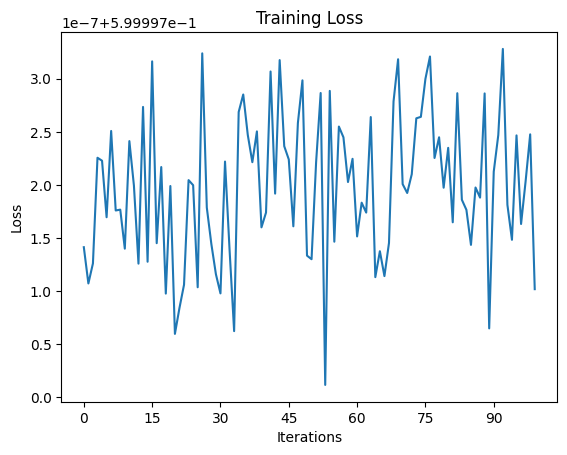

In [32]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_sgd)


In [33]:
# save the model
torch.save(model_inception.state_dict(), "quartet_loss2_SGD.pt")
torch.cuda.empty_cache()

In [34]:
# reset the model
model_inception = FaceRecInception().to(device)
optimizer = optim.SGD(model_inception.parameters(), lr=0.5)
generator = batch_generator(full_dataset, pairs, 150)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode="min", factor=0.7, patience=5)
# model_inception, train_losses_sgd = train_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
# model_inception, train_losses_sgd = train_quartet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
model_inception, train_losses_sgd = train_pair_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: 0.19999890779455504


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: 0.19999893898765245


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: 0.19999893695116044


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: 0.19999899556239445


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: 0.19999893685181935


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: 0.19999897837638855


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: 0.19999890262881914


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: 0.19999896695216496


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: 0.19999890466531117


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: 0.19999893714984257


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: 0.19999895508090654


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: 0.19999894340833027


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: 0.1999989502131939


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: 0.19999889771143595


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: 0.1999989292025566


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: 0.19999889214833577


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: 0.1999989933768908


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: 0.19999901662270228


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: 0.199999014933904


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: 0.19999894017974534


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: 0.19999900892376898


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: 0.19999897082646687


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: 0.19999901235103607


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: 0.19999900713562965


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: 0.19999886443217596


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: 0.19999881118535995


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: 0.19999903162320454


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: 0.19999906703829765


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: 0.1999989404777686


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: 0.19999894653757413


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: 0.1999989369014899


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: 0.19999900380770366


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: 0.19999895960092545


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: 0.1999989154438178


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: 0.1999989628791809


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: 0.19999898781379064


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: 0.19999891221523286


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: 0.19999900817871094


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: 0.1999990169207255


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: 0.19999893441796301


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: 0.19999895518024763


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: 0.19999889050920805


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: 0.19999889105558397


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: 0.19999896124005317


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: 0.19999893372257552


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: 0.19999891479810078


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: 0.1999988928437233


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: 0.1999988630414009


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: 0.19999894524614018


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: 0.19999899372458457


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: 0.199998952349027


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: 0.19999895125627518


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: 0.19999889388680459


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: 0.1999990079800288


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: 0.1999989467859268


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: 0.19999897186954815


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: 0.1999989972015222


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: 0.19999892135461173


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: 0.19999897142251333


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: 0.19999894971648852


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: 0.19999896536270778


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: 0.19999903147419293


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: 0.19999902720252674


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: 0.1999989815056324


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: 0.19999897008140882


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: 0.19999899367491406


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: 0.19999889999628068


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: 0.19999893849094708


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: 0.19999898046255113


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: 0.19999892602364222


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: 0.19999900594353676


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: 0.19999895215034486


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: 0.19999905119339625


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: 0.19999905526638032


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: 0.19999895721673966


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: 0.19999897162119548


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: 0.1999989081422488


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: 0.19999894867340723


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: 0.19999895885586738


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: 0.19999896426995595


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: 0.19999892249703408


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: 0.19999894509712854


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: 0.19999901498357456


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: 0.19999903842806815


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: 0.1999989582101504


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: 0.19999898235003152


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: 0.1999989395836989


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: 0.19999895259737968


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: 0.19999895468354226


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: 0.19999898369113603


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: 0.19999898254871368


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: 0.1999989968041579


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: 0.1999989368021488


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: 0.19999891807635625


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: 0.19999896883964538


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: 0.19999896789590518


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: 0.19999898225069046


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: 0.19999902109305065


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: 0.19999894311030705


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: 0.19999889185031255
Finished Training


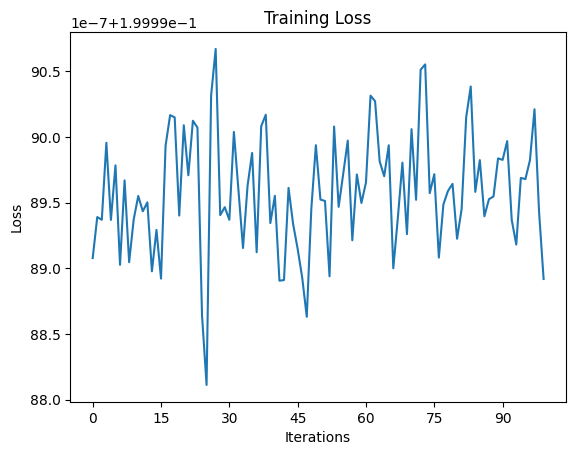

In [35]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_sgd)

In [36]:
# save the model
torch.save(model_inception.state_dict(), "triplet_pair_loss_SGD.pt")
torch.cuda.empty_cache()

In [37]:
model_inception = FaceRecInception().to(device)
optimizer = optim.Adagrad(model_inception.parameters(), lr=0.08, lr_decay=0.0001, weight_decay=0.0005)
generator = batch_generator(full_dataset, pairs, 150)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
# model_inception, train_losses_adagrad = train_quartet_loss(model_inception, generator, optimizer, scheduler, device, epochs=5, bathes_per_epoch=10)
# model_inception, train_losses_adagrad = train_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
model_inception, train_losses_adagrad = train_quartet_loss1(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: nan
Finished Training


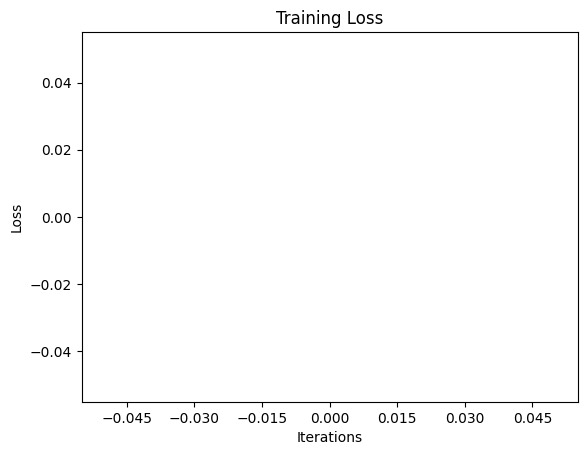

In [38]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_adagrad)

In [39]:
# save model
torch.save(model_inception.state_dict(), "quartet_loss1_Adagrad.pt")
torch.cuda.empty_cache()

In [40]:
model_inception = FaceRecInception().to(device)
optimizer = optim.Adagrad(model_inception.parameters(), lr=0.08, lr_decay=0.0001, weight_decay=0.0005)
generator = batch_generator(full_dataset, pairs, 150)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
# model_inception, train_losses_adagrad = train_quartet_loss(model_inception, generator, optimizer, scheduler, device, epochs=5, bathes_per_epoch=10)
# model_inception, train_losses_adagrad = train_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
model_inception, train_losses_adagrad = train_quartet_loss2(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: nan
Finished Training


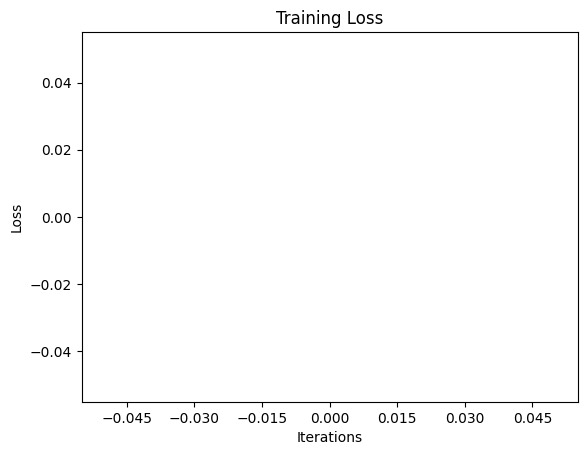

In [41]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_adagrad)

In [42]:
# save model
torch.save(model_inception.state_dict(), "quartet_loss1_Adagrad.pt")
torch.cuda.empty_cache()

In [43]:
model_inception = FaceRecInception().to(device)
optimizer = optim.Adagrad(model_inception.parameters(), lr=0.08, lr_decay=0.0001, weight_decay=0.0005)
generator = batch_generator(full_dataset, pairs, 150)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)
# model_inception, train_losses_adagrad = train_quartet_loss(model_inception, generator, optimizer, scheduler, device, epochs=5, bathes_per_epoch=10)
# model_inception, train_losses_adagrad = train_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=1, bathes_per_epoch=10)
model_inception, train_losses_adagrad = train_pair_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: 0.1999444904923439


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: nan


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: nan
Finished Training


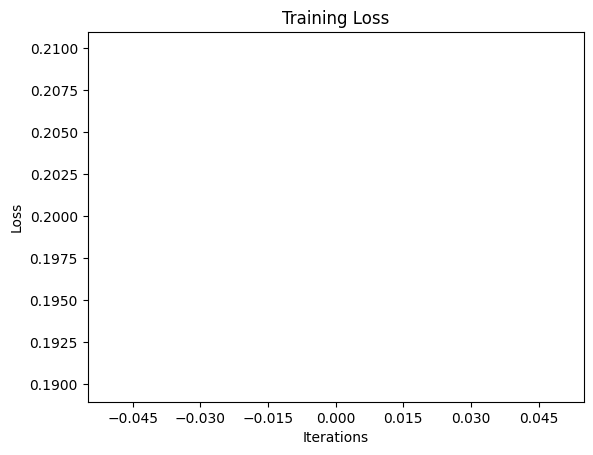

In [44]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_adagrad)

In [45]:
# save model
torch.save(model_inception.state_dict(), "triplet_pair_loss_Adagrad.pt")
torch.cuda.empty_cache()

* Am utilizat optimizatorul Adam, motivul fiind eventualele împărțiri la 0, $\pm\infty$ din SGD și Adagrad care duceau la valorile Nan sau loss constant. Am utilizat de această dată metoda de alegere a perechilor prezentată mai sus

In [46]:
model_inception = FaceRecInception().to(device)
optimizer = optim.Adam(model_inception.parameters(), lr=0.015)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.3, patience=5)
generator = batch_generator(full_dataset, pairs, 150)
model_inception, train_losses_adam = train_quartet_loss1(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: 0.3543337944149971


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: 0.35362091183662414


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: 0.35348595162232715


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: 0.35463073392709094


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: 0.35236274590094885


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: 0.3544999509056409


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: 0.3546013381083806


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: 0.353245704472065


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: 0.3539819159110387


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: 0.3534184215466181


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: 0.35451592634121576


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: 0.3533794902761777


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: 0.35138782650232314


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: 0.3548268014192581


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: 0.3550147630771001


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: 0.35377186685800555


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: 0.3538202514251073


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: 0.35368544469277063


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: 0.352330979804198


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: 0.3538290487726529


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: 0.35455833236376444


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: 0.3540691922108332


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: 0.35251778016487756


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: 0.3531843654314677


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: 0.35488812883694965


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: 0.35364380886157354


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: 0.35318642208973566


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: 0.3527089240153631


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: 0.35532782663901646


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: 0.3545637873808543


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: 0.35430482705434163


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: 0.3556755079825719


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: 0.35409217536449433


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: 0.35193790823221205


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: 0.3529646130402883


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: 0.3545912205179532


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: 0.3545737663904826


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: 0.3536123115817706


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: 0.3523989528417587


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: 0.3547266323367755


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: 0.3527002690235774


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: 0.353090499440829


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: 0.3527174534400304


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: 0.35329549888769785


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: 0.35348999718825025


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: 0.35540859440962475


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: 0.3522305088241895


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: 0.35558790107568106


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: 0.3546640091141065


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: 0.3550904863079389


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: 0.35332260698080065


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: 0.35493074635664623


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: 0.35362496664126714


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: 0.35462662676970164


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: 0.35466903934876126


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: 0.35410106579462686


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: 0.3542011182506879


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: 0.35612803906202317


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: 0.35429659177859624


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: 0.3552156920234362


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: 0.3534376599391301


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: 0.3562589700023333


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: 0.3546940301855405


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: 0.35475271473328274


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: 0.35338874330123266


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: 0.3539055230220159


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: 0.35279203643401463


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: 0.35329886625210444


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: 0.3531883904337883


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: 0.35416077603896456


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: 0.352200190226237


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: 0.35369754056135816


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: 0.35349806904792785


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: 0.3539716829856237


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: 0.3532415406902631


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: 0.3539030208190282


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: 0.3553426350156466


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: 0.3544868485132853


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: 0.3559853185216586


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: 0.3538662217060725


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: 0.35274568915367127


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: 0.35329099754492443


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: 0.35406207929054895


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: 0.35412041475375494


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: 0.35384644389152525


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: 0.35211738139390947


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: 0.35273978879054385


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: 0.3514657097061475


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: 0.35395453810691835


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: 0.35446742703517276


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: 0.3549475568532944


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: 0.35400044739246367


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: 0.3525310910741488


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: 0.35598935465017956


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: 0.35293145388364794


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: 0.35502944509188333


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: 0.3533456879854202


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: 0.3552527958154678


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: 0.3527393065889676


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: 0.35555521816015245
Finished Training


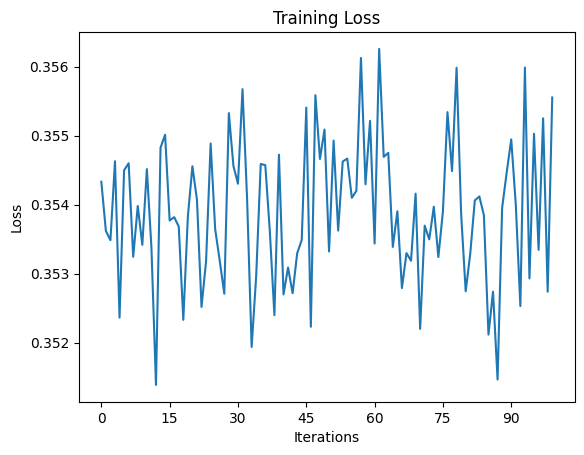

In [47]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_adam)

In [48]:
# Save the model with timestamp and dimension
tmstmp = time.strftime("%Y%m%d-%H%M%S")
torch.save(model_inception.state_dict(), "{}ADAM_LOSS1face_recognition_inception_better_pairing{}.pt".format(DIM, tmstmp))

# clean cuda memory
torch.cuda.empty_cache()

In [49]:
model_inception = FaceRecInception().to(device)
optimizer = optim.Adam(model_inception.parameters(), lr=0.015)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.3, patience=5)
generator = batch_generator(full_dataset, pairs, 150)
model_inception, train_losses_adam = train_quartet_loss2(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: 0.523432794312636


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: 0.5196048829952876


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: 0.5184465473890305


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: 0.51872445444266


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: 0.5186764218409856


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: 0.5214414023359617


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: 0.5221192827820778


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: 0.5176212958494822


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: 0.5195696566502254


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: 0.5197801726063093


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: 0.5185154551267623


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: 0.5200702096025149


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: 0.520619926850001


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: 0.5191508733232816


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: 0.5189144375920296


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: 0.5202708288033804


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: 0.5215263604124387


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: 0.5154978357752165


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: 0.5209246263901393


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: 0.5201790698369344


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: 0.5187876525521279


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: 0.5226162148515383


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: 0.5221353060007096


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: 0.5194645290573437


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: 0.5188515120744706


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: 0.5188645068804423


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: 0.5203690894444783


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: 0.5193526232242585


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: 0.5169064645965894


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: 0.5190444732705752


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: 0.5213346527020136


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: 0.5196279908219973


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: 0.5167313763499259


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: 0.5191125218073527


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: 0.5183912850419681


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: 0.5199397860964139


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: 0.5201617525021235


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: 0.5201805579662323


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: 0.521973832945029


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: 0.5199199306964875


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: 0.5191757129629453


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: 0.5200821003317833


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: 0.5171454640229544


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: 0.519541914065679


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: 0.5176833839217821


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: 0.5191888282696406


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: 0.521211272875468


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: 0.5193218602736791


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: 0.5197093730171521


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: 0.5220406824350357


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: 0.519936455488205


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: 0.5168844916423162


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: 0.5194586892922719


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: 0.5194180839260419


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: 0.5212287545204163


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: 0.5158546252051989


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: 0.5188440809647242


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: 0.5159389023979505


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: 0.5211419782042503


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: 0.518575809597969


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: 0.5188918723662694


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: 0.5191477384169897


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: 0.5192532562216123


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: 0.5211601452032725


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: 0.5178151169419288


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: 0.5170368129014968


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: 0.5185237015287082


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: 0.5180174590150515


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: 0.5222323514024416


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: 0.5169821574290594


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: 0.5175154769420623


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: 0.5206956074635187


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: 0.5170548433065414


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: 0.5205212736129761


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: 0.5171779164671898


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: 0.5190709278980891


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: 0.5190265017747879


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: 0.518940329750379


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: 0.5178742102781931


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: 0.5182759050528208


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: 0.5188237981994946


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: 0.5203031841913859


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: 0.5168408421675365


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: 0.5185859087109566


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: 0.5189642971754074


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: 0.519515876074632


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: 0.5204596769809723


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: 0.5177739702661832


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: 0.519781134625276


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: 0.5204366893569629


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: 0.5189528290430705


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: 0.5203407671054204


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: 0.5191762594381968


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: 0.5185163141290347


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: 0.5197457519173622


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: 0.5178476485610009


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: 0.5178776145974795


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: 0.5207195203502973


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: 0.5180766134460767


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: 0.5187431819240252
Finished Training


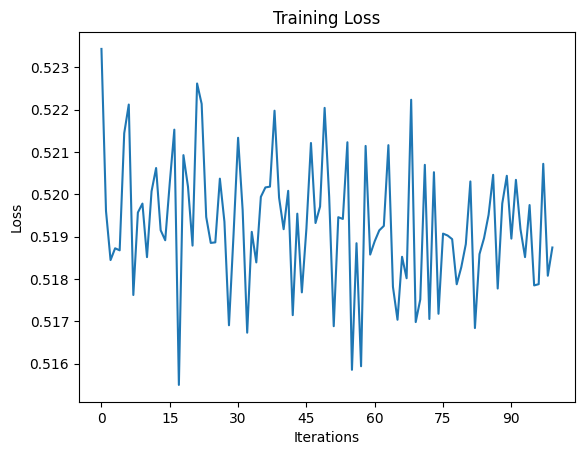

In [50]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_adam)

In [51]:
# Save the model with timestamp and dimension
tmstmp = time.strftime("%Y%m%d-%H%M%S")
torch.save(model_inception.state_dict(), "{}ADAM_LOSS2face_recognition_inception_better_pairing{}.pt".format(DIM, tmstmp))

# clean cuda memory
torch.cuda.empty_cache()

In [52]:
model_inception = FaceRecInception().to(device)
optimizer = optim.Adam(model_inception.parameters(), lr=0.015)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.3, patience=5)
generator = batch_generator(full_dataset, pairs, 150)
model_inception, train_losses_adam = train_pair_triplet_loss(model_inception, generator, optimizer, scheduler, device, epochs=EPOCHS, bathes_per_epoch=BATCHES_PER_EPOCH)

Epochs:   0%|          | 0/100 [00:00<?, ?it/s]

Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 1, Loss: 0.20064968188603718


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 2, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 3, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 4, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 5, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 6, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 7, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 8, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 9, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 10, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 11, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 12, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 13, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 14, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 15, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 16, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 17, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 18, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 19, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 20, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 21, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 22, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 23, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 24, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 25, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 26, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 27, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 28, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 29, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 30, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 31, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 32, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 33, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 34, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 35, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 36, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 37, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 38, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 39, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 40, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 41, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 42, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 43, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 44, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 45, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 46, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 47, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 48, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 49, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 50, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 51, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 52, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 53, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 54, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 55, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 56, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 57, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 58, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 59, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 60, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 61, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 62, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 63, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 64, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 65, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 66, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 67, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 68, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 69, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 70, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 71, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 72, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 73, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 74, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 75, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 76, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 77, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 78, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 79, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 80, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 81, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 82, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 83, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 84, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 85, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 86, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 87, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 88, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 89, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 90, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 91, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 92, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 93, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 94, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 95, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 96, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 97, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 98, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 99, Loss: 0.20000000298023224


Batches:   0%|          | 0/300 [00:00<?, ?it/s]

Epoch 100, Loss: 0.20000000298023224
Finished Training


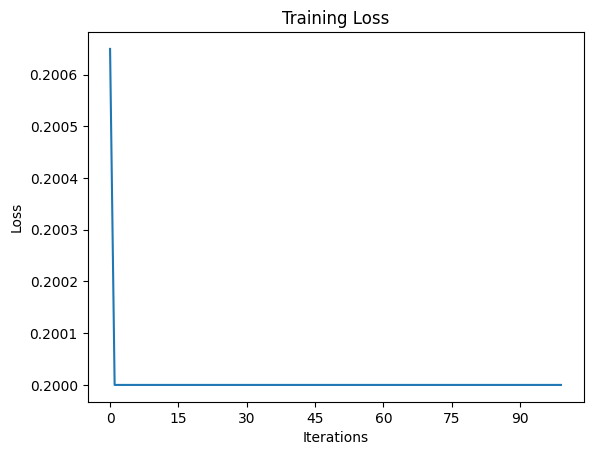

In [53]:
# plot the training loss
ax = plt.figure().gca()
ax.xaxis.set_major_locator(plt.MaxNLocator(integer=True))
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.title("Training Loss")
ax.plot(train_losses_adam)

In [54]:
# Save the model with timestamp and dimension
tmstmp = time.strftime("%Y%m%d-%H%M%S")
torch.save(model_inception.state_dict(), "{}face_recognition_inception_better_pairing{}.pt".format(DIM, tmstmp))

# clean cuda memory
torch.cuda.empty_cache()

### Evaluarea modelului
Am evaluat modelul vizual prin afișarea distanțelor dintre imagini, deocamdată nu am găsit o metodă de evaluare bazată pe procente

In [55]:
def evaluate3(model, generator, device, batches):
    model.eval()
    tabel_data = "| Anchor - Positive | Anchor - Negative |\n" +\
                 "|" + 19*"-" + "+" + 19*"-" + "|"
        
    with torch.no_grad():
        for i, data in zip(tnrange(batches, desc="Batches", leave=False), generator):
            anchors, positives, negatives = data
            anchors = torch.tensor(anchors[0], device=device, dtype=torch.float32)
            positives = torch.tensor(positives[0], device=device, dtype=torch.float32)
            negatives = torch.tensor(negatives[0], device=device, dtype=torch.float32)

            anchors = torch.transpose(anchors, 1, 3)
            positives = torch.transpose(positives, 1, 3)
            negatives = torch.transpose(negatives, 1, 3)
            # print(anchors.shape, positives.shape, negatives.shape)

            anchor_embeddings = model(anchors)
            positive_embeddings = model(positives)
            negative_embeddings = model(negatives)
            distance_positive = F.pairwise_distance(anchor_embeddings, positive_embeddings)
            distance_negative = F.pairwise_distance(anchor_embeddings, negative_embeddings)

            # print the distances in a table
            if i == 0:
                print(tabel_data)
            for j in range(len(anchors)):
                tabel_data = f"| {distance_positive[j]:.15f} | {distance_negative[j]:.15f} |"
                print(tabel_data)

In [56]:
def evaluate(model, generator, device, batches):
    model.eval()
    tabel_data = "| Anchor - Positive | Anchor - Negative |\n" +\
                 "|" + 19*"-" + "+" + 19*"-" + "|"
        
    with torch.no_grad():
        for i, data in zip(tqdm(range(batches), desc="Batches", leave=False), generator):
            anchors_positives, positives, anchors_negatives, negatives = data
            anchors_positives = torch.tensor(anchors_positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            positives = torch.tensor(positives[0], device=device, dtype=torch.float32).transpose(1, 3)
            anchors_negatives = torch.tensor(anchors_negatives[0], device=device, dtype=torch.float32).transpose(1, 3)
            negatives = torch.tensor(negatives[0], device=device, dtype=torch.float32).transpose(1, 3)

            anchor_positive_embeddings = model(anchors_positives)
            positive_embeddings = model(positives)
            anchor_negative_embeddings = model(anchors_negatives)
            negative_embeddings = model(negatives)
            distance_positive = F.pairwise_distance(anchor_positive_embeddings, positive_embeddings)
            distance_negative = F.pairwise_distance(anchor_positive_embeddings, negative_embeddings)
            distance_anchor_negative = F.pairwise_distance(anchor_positive_embeddings, anchor_negative_embeddings)

            # print the distances in a table
            if i == 0:
                print(tabel_data)
            for j in range(len(anchors_positives)):
                tabel_data = f"| {distance_positive[j]:.15f} | {distance_negative[j]:.15f} |"
                print(tabel_data)
            



In [57]:
generator = batch_generator(full_dataset, pairs, 256)
model_inception = FaceRecInception().to(device)
# tmstmp="20250119-032723"
state_dict = torch.load("{}face_recognition_inception_better_pairing{}.pt".format(DIM, tmstmp), weights_only=True)
# Remove 'module.' prefix from keys if present
state_dict = {k.replace('module.', ''): v for k, v in state_dict.items()}
model_inception.load_state_dict(state_dict=state_dict)
evaluate(model_inception, generator, device, batches=2)

Batches:   0%|          | 0/2 [00:00<?, ?it/s]

| Anchor - Positive | Anchor - Negative |
|-------------------+-------------------|


| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.0000113137

| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.000011313708455 |
| 0.000011313708455 | 0.0000113137

##### Evaluare intuitivă a unui sample de 4 imagini. 2 matched, 2 mismatched

AnchorP - Positive Distance: 1.1313708455418237e-05
 AnchorP - Negative Distance: 1.1313708455418237e-05
  AnchorP - AnchorN Distance: 1.1313708455418237e-05 
   AnchorN - Negative Distance: 1.1313708455418237e-05


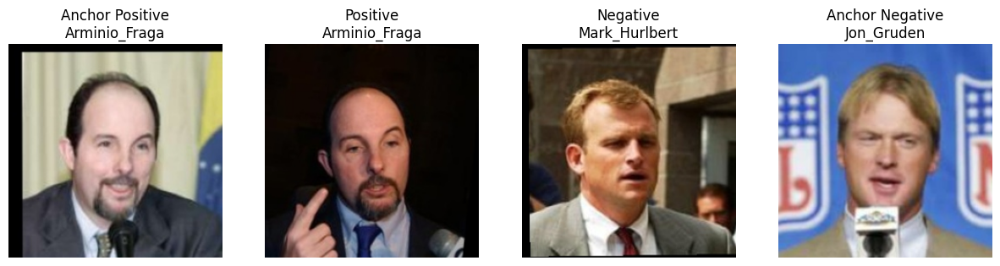

In [58]:
image_generator = batch_generator(full_dataset, pairs, 1)
an_data, pos_data, an_neg_data, neg_data = next(image_generator)
an = torch.tensor(an_data[0], device=device, dtype=torch.float32)
pos = torch.tensor(pos_data[0], device=device, dtype=torch.float32)
neg = torch.tensor(neg_data[0], device=device, dtype=torch.float32)
an_neg = torch.tensor(an_neg_data[0], device=device, dtype=torch.float32)
an_t = torch.transpose(an, 1, 3)
pos_t = torch.transpose(pos, 1, 3)
neg_t = torch.transpose(neg, 1, 3)
an_neg_t = torch.transpose(an_neg, 1, 3)
an_emb = model_inception(an_t)
pos_emb = model_inception(pos_t)
neg_emb = model_inception(neg_t)
an_neg_emb = model_inception(an_neg_t)
distance_positive = F.pairwise_distance(an_emb, pos_emb)
distance_negative = F.pairwise_distance(an_emb, neg_emb)
distance_an_neg = F.pairwise_distance(an_emb, an_neg_emb)
distance_an_neg_negatives = F.pairwise_distance(an_neg_emb, neg_emb)
print(f"AnchorP - Positive Distance: {distance_positive.item()}\n AnchorP - Negative Distance: {distance_negative.item()}\n",
      f" AnchorP - AnchorN Distance: {distance_an_neg.item()} \n   AnchorN - Negative Distance: {distance_an_neg_negatives.item()}")
fig = plt.figure(figsize=(15, 15))
ax = plt.subplot(1, 4, 1)
ax.imshow(an[0].cpu().numpy().transpose(0, 1, 2))
ax.axis("off")
ax.set_title(f"Anchor Positive\n{an_data[1][0]}")
ax = plt.subplot(1, 4, 2)
ax.imshow(pos[0].cpu().numpy().transpose(0, 1, 2))
ax.axis("off")
ax.set_title(f"Positive\n{pos_data[1][0]}")
ax = plt.subplot(1, 4, 3)
ax.imshow(neg[0].cpu().numpy().transpose(0, 1, 2))
ax.axis("off")
ax.set_title(f"Negative\n{neg_data[1][0]}")
ax = plt.subplot(1, 4, 4)
ax.imshow(an_neg[0].cpu().numpy().transpose(0, 1, 2))
ax.axis("off")
ax.set_title(f"Anchor Negative\n{an_neg_data[1][0]}")
plt.show()


**M-am asigurat că nu am probleme cu ponderile, crezând că ar fi 0**

In [59]:
# Check if weights are zero
for name, param in model_inception.named_parameters():
    print(f"{name} - mean: {param.mean().item()}, std: {param.std().item()}")

# Check if gradients are zero
for name, param in model_inception.named_parameters():
    if param.grad is not None:
        print(f"{name} grad - mean: {param.grad.mean().item()}, std: {param.grad.std().item()}")

conv1.weight - mean: -0.004836250562220812, std: 0.07541555166244507
conv1.bias - mean: -0.05979182943701744, std: 0.06577865779399872
inception1.0.weight - mean: 0.0005880079115740955, std: 0.08927648514509201
inception1.0.bias - mean: -0.023194001987576485, std: 0.0834086611866951
inception1.2.weight - mean: -0.0027890109922736883, std: 0.052427031099796295
inception1.2.bias - mean: -0.02012886106967926, std: 0.05841628089547157
inception3a1x1.0.weight - mean: 0.0016378596192225814, std: 0.0641990602016449
inception3a1x1.0.bias - mean: 0.001307410653680563, std: 0.08101920783519745
inception3a3x3.0.weight - mean: -0.0065875849686563015, std: 0.06124826520681381
inception3a3x3.0.bias - mean: -0.004333820194005966, std: 0.06832871586084366
inception3a3x3.2.weight - mean: -0.005786793306469917, std: 0.04879345744848251
inception3a3x3.2.bias - mean: -0.02129482477903366, std: 0.05863773077726364
inception3a5x5.0.weight - mean: 0.004048449452966452, std: 0.058449797332286835
inception3a5x

inception5a3x3.2.weight - mean: -0.0030682955402880907, std: 0.04410082474350929
inception5a3x3.2.bias - mean: -0.003896971233189106, std: 0.06597471237182617
inception5a5x5.0.weight - mean: -0.004945255815982819, std: 0.043146442621946335
inception5a5x5.0.bias - mean: -0.01253826729953289, std: 0.06618595868349075
inception5a5x5.2.weight - mean: -0.0019385979976505041, std: 0.04398448392748833
inception5a5x5.2.bias - mean: -0.003697230014950037, std: 0.06955676525831223
inception5apool.1.weight - mean: -0.0023572996724396944, std: 0.04202665761113167
inception5apool.1.bias - mean: -0.003945884294807911, std: 0.060772258788347244
inception5b1x1.0.weight - mean: -0.004516715183854103, std: 0.04200369864702225
inception5b1x1.0.bias - mean: -0.003968019969761372, std: 0.05473501607775688
inception5b3x3.0.weight - mean: -0.00940894614905119, std: 0.043945662677288055
inception5b3x3.0.bias - mean: -0.010213258676230907, std: 0.05931774154305458
inception5b3x3.2.weight - mean: -0.00501293363

In [60]:
# Verify loss function
generator = batch_generator(full_dataset, pairs, 1)
model_inception = FaceRecInception().to(device)

# Ensure optimizer is updating parameters
for epoch in range(10):
    optimizer.zero_grad()
    anchors, positives, anchors_negatives, negatives = next(generator)
    anchors = torch.tensor(anchors[0], device=device, dtype=torch.float32).transpose(1, 3)
    positives = torch.tensor(positives[0], device=device, dtype=torch.float32).transpose(1, 3)
    negatives = torch.tensor(negatives[0], device=device, dtype=torch.float32).transpose(1, 3)
    anchors_negatives = torch.tensor(anchors_negatives[0], device=device, dtype=torch.float32).transpose(1, 3)

    
    anchor_embeddings = model_inception(anchors)
    positive_embeddings = model_inception(positives)
    negative_embeddings = model_inception(negatives)
    anchor_negative_embeddings = model_inception(anchors_negatives)
    
    loss = pair_triplet_loss(anchor_embeddings, positive_embeddings, negative_embeddings, anchor_negative_embeddings)
    loss.backward()
    optimizer.step()
    
    print(f"Loss: {loss.item()}")
    for name, param in model_inception.named_parameters():
        if param.grad is not None:
            print(f"{name} grad - mean: {param.grad.mean().item()}, std: {param.grad.std().item()}")

Loss: 0.1999959796667099
conv1.weight grad - mean: -1.6323420481967332e-07, std: 1.06273341771157e-06
conv1.bias grad - mean: -4.008282417089504e-08, std: 1.3820678077536286e-06
inception1.0.weight grad - mean: -1.110715146523944e-07, std: 1.2810897942472366e-06
inception1.0.bias grad - mean: -9.138940981756605e-08, std: 2.972348966068239e-06
inception1.2.weight grad - mean: -1.904978397249124e-08, std: 5.683135668732575e-07
inception1.2.bias grad - mean: 7.136959823128564e-08, std: 2.8448177999962354e-06
inception3a1x1.0.weight grad - mean: -9.118056709667144e-08, std: 6.647205736953765e-07
inception3a1x1.0.bias grad - mean: -1.54901351834269e-06, std: 5.73947727389168e-06
inception3a3x3.0.weight grad - mean: -2.7766242638449512e-08, std: 2.7206220920561464e-07
inception3a3x3.0.bias grad - mean: -5.225013524068345e-07, std: 4.1492435229883995e-06
inception3a3x3.2.weight grad - mean: -2.7050216289126183e-08, std: 2.776399696813314e-07
inception3a3x3.2.bias grad - mean: -9.8841121598525

inception4a3x3.0.weight grad - mean: -8.130382589399687e-09, std: 3.074013079640281e-07
inception4a3x3.0.bias grad - mean: -6.288604481596849e-07, std: 1.194197466247715e-05
inception4a3x3.2.weight grad - mean: 3.1812945611164878e-09, std: 2.3046115416036628e-07
inception4a3x3.2.bias grad - mean: 4.900414865005587e-07, std: 1.1200394510524347e-05
inception4a5x5.0.weight grad - mean: 1.4964369299264035e-08, std: 1.9013479857221682e-07
inception4a5x5.0.bias grad - mean: 1.271850806006114e-06, std: 5.710187451768434e-06
inception4a5x5.2.weight grad - mean: -9.329848005279473e-09, std: 2.589852385881386e-07
inception4a5x5.2.bias grad - mean: -6.713215157105878e-07, std: 1.1622158126556315e-05
inception4apool.1.weight grad - mean: -5.013900961081674e-10, std: 6.468490596489573e-07
inception4apool.1.bias grad - mean: 9.913935627992032e-08, std: 2.572637276898604e-05
inception4b1x1.0.weight grad - mean: -3.529811820612849e-08, std: 6.455083507717063e-07
inception4b1x1.0.bias grad - mean: -3.4

fc1.bias grad - mean: 2.3495740606449544e-06, std: 1.1204075235582422e-05
Loss: 0.19999761879444122
conv1.weight grad - mean: -5.592610250459984e-07, std: 3.4454981232556747e-06
conv1.bias grad - mean: -2.0967702596408344e-07, std: 4.885532234766288e-06
inception1.0.weight grad - mean: -3.842623641503451e-07, std: 3.871058652293868e-06
inception1.0.bias grad - mean: -8.550768484383298e-07, std: 9.733990737004206e-06
inception1.2.weight grad - mean: -1.6281400405659952e-07, std: 1.7718613207762246e-06
inception1.2.bias grad - mean: -1.0795552043418866e-06, std: 9.636189133743756e-06
inception3a1x1.0.weight grad - mean: -1.9321599609156692e-07, std: 2.018128270719899e-06
inception3a1x1.0.bias grad - mean: -3.929289960069582e-06, std: 2.116913310601376e-05
inception3a3x3.0.weight grad - mean: -5.4499366797244875e-08, std: 9.171896522275347e-07
inception3a3x3.0.bias grad - mean: -1.0622634363244288e-06, std: 1.4790282875765115e-05
inception3a3x3.2.weight grad - mean: -7.91540344380337e-08,

### Folosirea librăriei [FiftyOne](https://voxel51.com/)
**Încarc un dataset de testare compus din 100 imagini**

In [61]:
random_samples = fo.Dataset.from_dir(
    dataset_dir='/home/ichitu/fiftyone/lfw/lfw_funneled',
    dataset_type=fo.types.dataset_types.ImageClassificationDirectoryTree,
    name='lfw_funneled_random',
    overwrite=True,
    # max_samples=50
    
)
random_dataset = LFWDataset(random_samples)

   0% ||------------|     1/13233 [7.4ms elapsed, 1.6m remaining, 135.1 samples/s] 

   4% |/------------|   585/13233 [139.9ms elapsed, 3.0s remaining, 4.2K samples/s] 

  11% |█------------|  1470/13233 [338.5ms elapsed, 2.7s remaining, 4.3K samples/s] 

  18% |██\----------|  2363/13233 [536.5ms elapsed, 2.5s remaining, 4.4K samples/s] 

  25% |███|---------|  3263/13233 [734.1ms elapsed, 2.2s remaining, 4.4K samples/s] 

  32% |████/--------|  4174/13233 [936.1ms elapsed, 2.0s remaining, 4.5K samples/s] 

  38% |████---------|  5076/13233 [1.3s elapsed, 2.2s remaining, 3.8K samples/s]    

  49% |██████\------|  6427/13233 [1.6s elapsed, 1.7s remaining, 3.9K samples/s]    

  55% |███████|-----|  7339/13233 [1.8s elapsed, 1.5s remaining, 4.0K samples/s]    

  62% |████████/----|  8242/13233 [2.0s elapsed, 1.2s remaining, 4.1K samples/s]    

  69% |████████-----|  9148/13233 [2.4s elapsed, 1.1s remaining, 3.7K samples/s]    

  73% |█████████\---|  9594/13233 [2.5s elapsed, 983.7ms remaining, 3.7K samples/s] 

  79% |██████████|--| 10471/13233 [2.7s elapsed, 745.8ms remaining, 3.7K samples/s] 

  86% |███████████/-| 11374/13233 [2.9s elapsed, 502.7ms remaining, 3.7K samples/s] 

  93% |████████████-| 12278/13233 [3.1s elapsed, 258.9ms remaining, 3.7K samples/s] 

 100% |████████████\| 13183/13233 [3.3s elapsed, 12.3ms remaining, 4.1K samples/s]  

 100% |█████████████| 13233/13233 [3.4s elapsed, 0s remaining, 4.0K samples/s]      


* Preprocesarea și alcătuirea unei liste cu imaginile mele

In [62]:
def preprocess_image(image):
    image = image.resize((224, 224))
    image = transforms.ToTensor()(image)
    # image = F.normalize(image)
    image = image.unsqueeze(0)
    return image

def get_image(image):
    return Image.fromarray(image)

def get_images(images):
    return [get_image(image) for image in images]

def get_image_from_sample(sample):
    return get_image(np.array(sample[0]))

def get_images_from_samples(samples):
    return [get_image_from_sample(sample) for sample in samples]

print(len(random_dataset))
images = get_images_from_samples(random_dataset)
print(len(images))

13233


13233


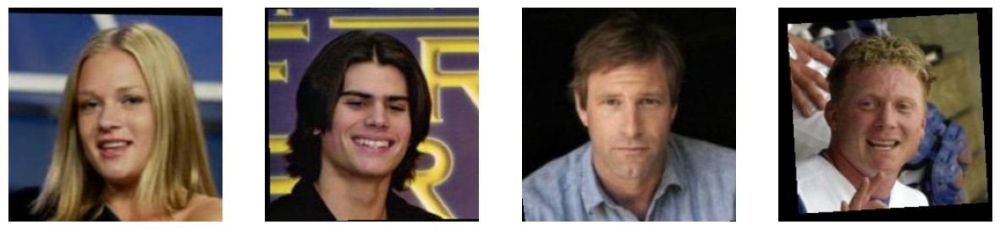

In [63]:
plt.figure(figsize=(15, 15))
for i in range(4):
    plt.subplot(1, 4, i+1)
    plt.imshow(images[i])
    plt.axis("off")

* Creearea unei liste de embeddinguri pentru imagini

In [64]:
def get_embedding(image):
    image = preprocess_image(image)
    # print(image.shape)
    # plt.imshow(image[0])
    # get image on cuda
    image = image.cuda()
    # get embedding
    embedding = model_inception(image)
    return embedding.cpu().detach().numpy()

def get_embeddings(images):
    embeddings = []
    for image in tqdm(images):
       embeddings.append(get_embedding(image))
    return np.array(embeddings)

In [65]:
embeddings = get_embeddings(images)
embeddings = embeddings.reshape(embeddings.shape[0], embeddings.shape[2])
print(embeddings.shape)

  0%|          | 0/13233 [00:00<?, ?it/s]

(13233, 128)


### Testare acuratețe

In [66]:
from sklearn.metrics import accuracy_score


# print(pairs[0]['matched'])
# print(pairs[0]['mismatched'])

def get_image_from_path(path):
    return Image.open(path)

def get_images_from_pairs(pair, dataset_path='/home/ichitu/fiftyone/lfw/lfw_funneled'):
    matched = pair['matched']
    mismatched = pair['mismatched']
    matched_images = []
    mismatched_images = []
    for match in matched:
        matched_images.append((get_image_from_path(match[0]), get_image_from_path(match[1])))
    for mismatch in mismatched:
        mismatched_images.append((get_image_from_path(mismatch[0]), get_image_from_path(mismatch[1])))
    return matched_images, mismatched_images


def verify(embedding1, embedding2, threshold=0.2):
    embedding1 = torch.tensor(embedding1, device=device, dtype=torch.float32).unsqueeze(0)
    embedding2 = torch.tensor(embedding2, device=device, dtype=torch.float32).unsqueeze(0)
    distance = F.pairwise_distance(embedding1, embedding2)
    return distance.item() < threshold

predictions = []
# for i in range(0, len(pairs), 2):
#     matched, mismatched = get_images_from_pairs(pairs[i])
#     matched_embeddings1, matched_embeddings2 = [], []
#     for match in matched:
#         matched_embeddings1.append(get_embedding(match[0]))
#         matched_embeddings2.append(get_embedding(match[1]))
#     mismatched_embeddings1, mismatched_embeddings2 = [], []
#     for mismatch in mismatched:
#         mismatched_embeddings1.append(get_embedding(mismatch[0]))
#         mismatched_embeddings2.append(get_embedding(mismatch[1]))
#     for i in range(len(matched_embeddings1)):
#         predictions.append(verify(matched_embeddings1[i], matched_embeddings2[i]))
#     for i in range(len(mismatched_embeddings1)):
#         predictions.append(verify(mismatched_embeddings1[i], mismatched_embeddings2[i]))

for i in tnrange(0, len(pairs)):
    matched, mismatched = get_images_from_pairs(pairs[i])
    matched_embeddings1, matched_embeddings2 = [], []
    for j, match in zip(tnrange(len(matched), desc="Matched", leave=False), matched):
        matched_embeddings1.append(get_embedding(match[0]))
        matched_embeddings2.append(get_embedding(match[1]))
        predictions.append(verify(matched_embeddings1[j], matched_embeddings2[j]))
    mismatched_embeddings1, mismatched_embeddings2 = [], []
    for j, mismatch in zip(tnrange(len(mismatched), desc="Mismatched", leave=False), mismatched):
        mismatched_embeddings1.append(get_embedding(mismatch[0]))
        mismatched_embeddings2.append(get_embedding(mismatch[1]))
        predictions.append(verify(mismatched_embeddings1[j], mismatched_embeddings2[j]))
    for j in tnrange(len(matched), desc="Matched verify", leave=False):
        predictions.append(verify(matched_embeddings1[j], matched_embeddings2[j]))
    for j in tnrange(len(mismatched), desc="Mismatched verify", leave=False):
        predictions.append(verify(mismatched_embeddings1[j], mismatched_embeddings2[j]) == 0)

score = accuracy_score(predictions, [True]*len(predictions))
print(f"Accuracy: {score*100}% for {len(predictions)} samples")

  0%|          | 0/10 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Matched:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched:   0%|          | 0/300 [00:00<?, ?it/s]

Matched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Mismatched verify:   0%|          | 0/300 [00:00<?, ?it/s]

Accuracy: 75.0% for 12000 samples


* Folosirea [FiftyOne Brain](https://docs.voxel51.com/brain.html) pentru a avea o reprezentare în spațiu 2D a embeddingurilor

In [67]:
results = fob.compute_visualization(
    random_samples,
    embeddings=embeddings,
    label_field="ground_truth.label",
    classes=random_samples.values("ground_truth.label"),
    brain_key="faceNet_embeddings_tsne",
    output_dir="faceNet_embeddings",
    overwrite=True,
    method = "tsne",
    
)

results = fob.compute_visualization(
    random_samples,
    embeddings=embeddings,
    label_field="ground_truth.label",
    classes=random_samples.values("ground_truth.label"),
    brain_key="faceNet_embeddings_pca",
    output_dir="faceNet_embeddings",
    overwrite=True,
    method = "pca",
    
)

results = fob.compute_visualization(
    random_samples,
    embeddings=embeddings,
    label_field="ground_truth.label",
    classes=random_samples.values("ground_truth.label"),
    brain_key="faceNet_embeddings_umap",
    output_dir="faceNet_embeddings",
    overwrite=True,
    method = "umap",
    
)

Generating visualization...


/home/ichitu/machine-learning/lib/python3.10/site-packages/sklearn/manifold/_t_sne.py:1164: FutureWarning: 'n_iter' was renamed to 'max_iter' in version 1.5 and will be removed in 1.7.
  warnings.warn(


[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 13233 samples in 0.001s...


[t-SNE] Computed neighbors for 13233 samples in 0.261s...
[t-SNE] Computed conditional probabilities for sample 1000 / 13233
[t-SNE] Computed conditional probabilities for sample 2000 / 13233
[t-SNE] Computed conditional probabilities for sample 3000 / 13233
[t-SNE] Computed conditional probabilities for sample 4000 / 13233
[t-SNE] Computed conditional probabilities for sample 5000 / 13233
[t-SNE] Computed conditional probabilities for sample 6000 / 13233


[t-SNE] Computed conditional probabilities for sample 7000 / 13233
[t-SNE] Computed conditional probabilities for sample 8000 / 13233
[t-SNE] Computed conditional probabilities for sample 9000 / 13233
[t-SNE] Computed conditional probabilities for sample 10000 / 13233
[t-SNE] Computed conditional probabilities for sample 11000 / 13233
[t-SNE] Computed conditional probabilities for sample 12000 / 13233
[t-SNE] Computed conditional probabilities for sample 13000 / 13233
[t-SNE] Computed conditional probabilities for sample 13233 / 13233
[t-SNE] Mean sigma: 0.000002
[t-SNE] Computed conditional probabilities in 0.390s


[t-SNE] Iteration 50: error = 92.9373016, gradient norm = 0.0123881 (50 iterations in 0.991s)


[t-SNE] Iteration 100: error = 90.0675659, gradient norm = 0.0008039 (50 iterations in 0.941s)


[t-SNE] Iteration 150: error = 89.9305267, gradient norm = 0.0001298 (50 iterations in 0.948s)


[t-SNE] Iteration 200: error = 89.9193573, gradient norm = 0.0000950 (50 iterations in 0.913s)


[t-SNE] Iteration 250: error = 89.9152527, gradient norm = 0.0000996 (50 iterations in 0.859s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 89.915253


[t-SNE] Iteration 300: error = 3.7250369, gradient norm = 0.0111435 (50 iterations in 0.945s)


[t-SNE] Iteration 350: error = 3.3855152, gradient norm = 0.0087051 (50 iterations in 0.717s)


[t-SNE] Iteration 400: error = 3.2367222, gradient norm = 0.0079781 (50 iterations in 0.706s)


[t-SNE] Iteration 450: error = 3.1440902, gradient norm = 0.0075236 (50 iterations in 0.708s)


[t-SNE] Iteration 500: error = 3.0790474, gradient norm = 0.0072047 (50 iterations in 0.711s)


[t-SNE] Iteration 550: error = 3.0298631, gradient norm = 0.0068866 (50 iterations in 0.712s)


[t-SNE] Iteration 600: error = 2.9913218, gradient norm = 0.0066468 (50 iterations in 0.718s)


[t-SNE] Iteration 650: error = 2.9600053, gradient norm = 0.0064229 (50 iterations in 0.722s)


[t-SNE] Iteration 700: error = 2.9339657, gradient norm = 0.0062315 (50 iterations in 0.724s)


[t-SNE] Iteration 750: error = 2.9120827, gradient norm = 0.0060814 (50 iterations in 0.727s)


[t-SNE] Iteration 800: error = 2.8935304, gradient norm = 0.0057583 (50 iterations in 0.726s)


[t-SNE] Iteration 850: error = 2.8775895, gradient norm = 0.0055555 (50 iterations in 0.728s)


[t-SNE] Iteration 900: error = 2.8637426, gradient norm = 0.0053362 (50 iterations in 0.737s)


[t-SNE] Iteration 950: error = 2.8516202, gradient norm = 0.0051381 (50 iterations in 0.738s)


[t-SNE] Iteration 1000: error = 2.8409631, gradient norm = 0.0050059 (50 iterations in 0.739s)
[t-SNE] KL divergence after 1000 iterations: 2.840963
Generating visualization...


Generating visualization...


/home/ichitu/machine-learning/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(


UMAP( verbose=True)
Sat Jan 25 22:37:49 2025 Construct fuzzy simplicial set
Sat Jan 25 22:37:49 2025 Finding Nearest Neighbors
Sat Jan 25 22:37:49 2025 Building RP forest with 11 trees


Sat Jan 25 22:37:53 2025 NN descent for 14 iterations


	 1  /  14
	 2  /  14


	 3  /  14
	 4  /  14
	 5  /  14
	 6  /  14
	Stopping threshold met -- exiting after 6 iterations
Sat Jan 25 22:38:04 2025 Finished Nearest Neighbor Search


Sat Jan 25 22:38:06 2025 Construct embedding


Epochs completed:   0%|            0/200 [00:00]

	completed  0  /  200 epochs
	completed  20  /  200 epochs
	completed  40  /  200 epochs
	completed  60  /  200 epochs
	completed  80  /  200 epochs
	completed  100  /  200 epochs
	completed  120  /  200 epochs


	completed  140  /  200 epochs
	completed  160  /  200 epochs
	completed  180  /  200 epochs
Sat Jan 25 22:38:09 2025 Finished embedding


**Metode de calculare**
* TSNE
* PCA
* UMAP

Din ce am observat, PCA pare o reprezentare mai potrivită

In [68]:

sess = fo.launch_app(dataset=random_samples, port=10100)
sess.open_tab()

<IPython.core.display.Javascript object>